## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [2]:
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

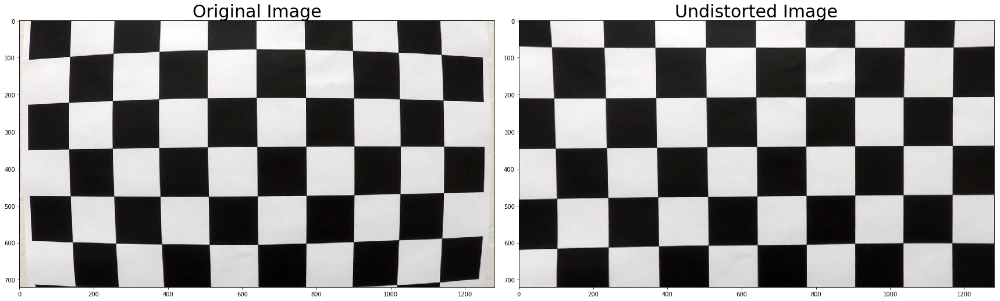

In [3]:
%matplotlib inline
# Camera calibration, given object points, image points, and the shape of the grayscale image
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

img = mpimg.imread('../camera_cal/calibration1.jpg')
dst = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image',fontsize = 30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image',fontsize = 30)
plt.show()

## Apply a distortion correction to raw images.

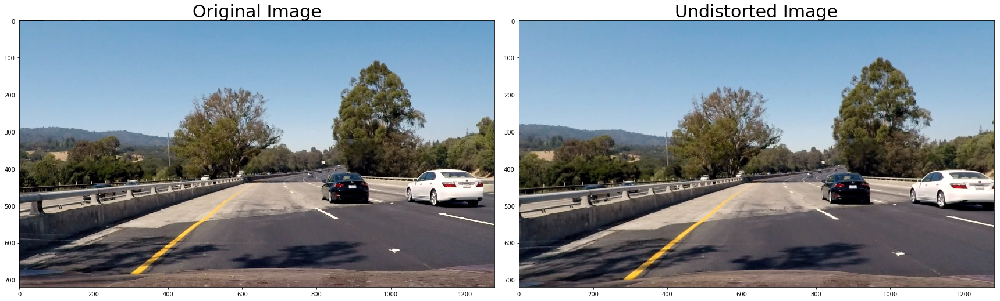

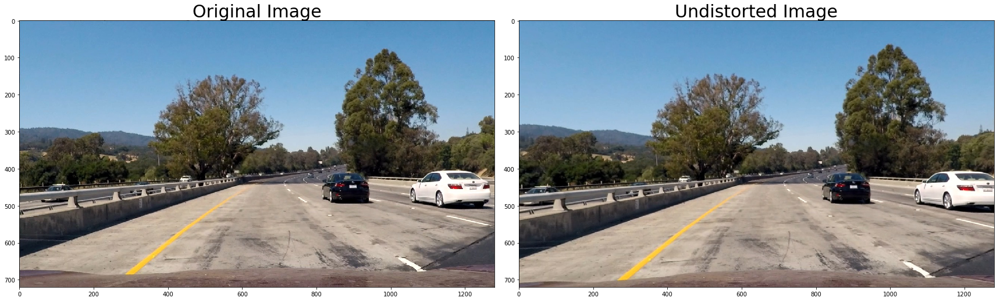

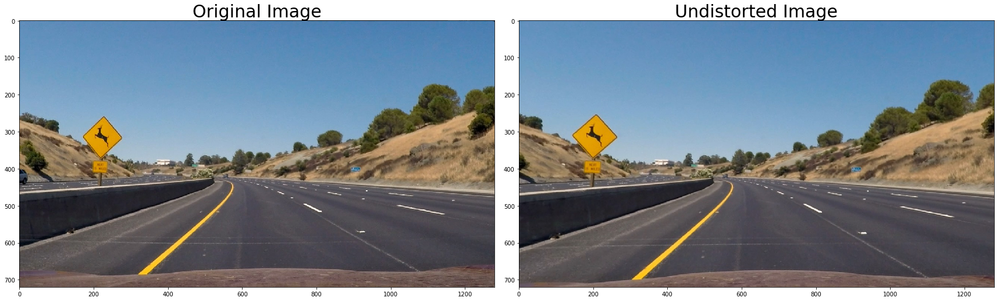

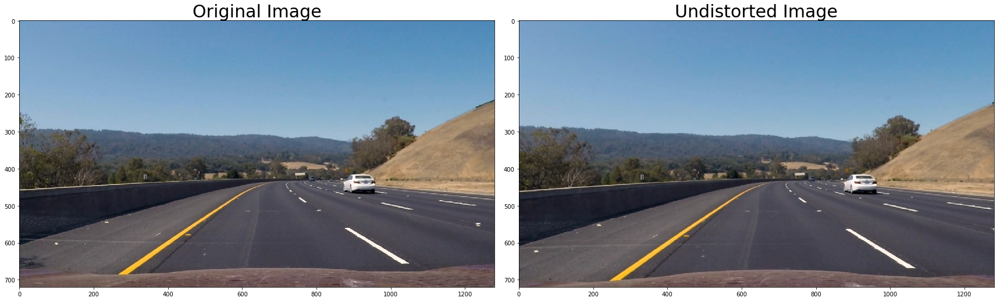

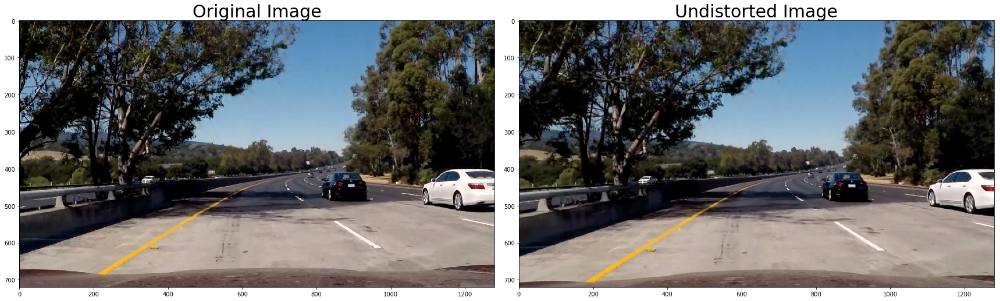

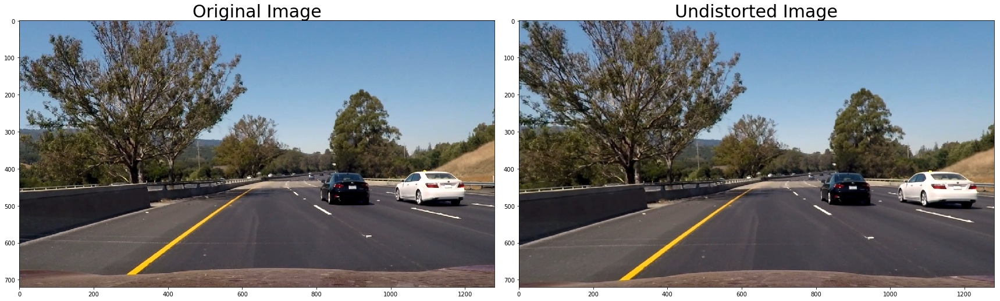

In [4]:
images = glob.glob('../test_images/test*.jpg')

for fname in images:
    img = mpimg.imread(fname)
    dst = cv2.undistort(img, mtx, dist, None, mtx)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image',fontsize = 30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image',fontsize = 30)
plt.show()

## Use color transforms, gradients, etc., to create a thresholded binary image.

In [5]:
def scaled_mask(abs_grad, thresh=(0,255)):
    # Scale absolute value of gradient to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_gradient = np.uint8(255*abs_grad/np.max(abs_grad))
    # Create a binary mask where thresholds are met
    binary_output = np.zeros_like(scaled_gradient)
    binary_output[(scaled_gradient >= thresh[0]) & (scaled_gradient <= thresh[1])] = 1
    return binary_output
    
def pipeline(img, sobel_kernel=3, sx_thresh=(0,255), sy_thresh=(0,255),
             mag_thresh=(0,255), dir_thresh=(0, np.pi/2),
             s_ch_thresh=(0,255), mtx=mtx, dist=dist):
    # Note: img is the undistorted image
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
    # Sobel x
    abs_sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel))
    sxbinary = scaled_mask(abs_sobelx, thresh=sx_thresh)
    
    # Sobel y
    abs_sobely = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel))
    sybinary = scaled_mask(abs_sobely, thresh=sy_thresh)
    
    # Magnitude of the Gradient
    abs_sobelxy = np.sqrt(abs_sobelx ** 2 + abs_sobely **2)
    mag_binary = scaled_mask(abs_sobelxy, thresh=mag_thresh)

    # Direction of the Gradient
    sobeldir = np.arctan2(abs_sobely, abs_sobelx)
    dir_binary = scaled_mask(sobeldir, thresh=dir_thresh)
    
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_ch_thresh[0]) & (s_channel <= s_ch_thresh[1])] = 1
    
    # Combined
    combined = np.zeros_like(gray)
    combined[((sxbinary == 1) & (sybinary == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (s_binary == 1)] = 1
    binary_output = combined
    
    
    
#     # Plot the result
#     f, ((ax1, ax2, ax3), (ax4, ax5, ax6),(ax7,ax8,ax9)) = plt.subplots(3, 3, figsize=(24, 18))
# #     f.tight_layout()

#     ax1.imshow(img)
#     ax1.set_title('Original Image', fontsize=40)

#     ax2.imshow(sxbinary,  cmap ='gray')
#     ax2.set_title('sxbinary', fontsize=40)
#     plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#     ax3.imshow(sybinary,  cmap ='gray')
#     ax3.set_title('sybinary', fontsize=40)
#     plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#     ax4.imshow(mag_binary,  cmap ='gray')
#     ax4.set_title('mag_binary', fontsize=40)
#     plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
#     ax5.imshow(dir_binary,  cmap ='gray')
#     ax5.set_title('dir_binary', fontsize=40)
#     plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
#     ax6.imshow(s_binary,  cmap ='gray')
#     ax6.set_title('s_binary', fontsize=40)
#     plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#     ax9.imshow(combined,  cmap ='gray')
#     ax9.set_title('combined', fontsize=40)
#     plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    return binary_output

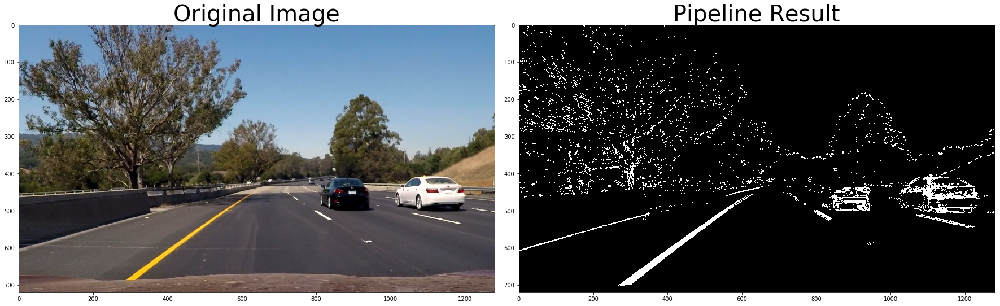

In [11]:
image = mpimg.imread('../test_images/test6.jpg')


result = pipeline(image, sobel_kernel=9, sx_thresh=(20,100),sy_thresh = (50,200), 
                  mag_thresh=(30, 100), dir_thresh=(0.7, 1.3),
                  s_ch_thresh=(170,255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result,  cmap ='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Apply a perspective transform to rectify binary image ("birds-eye view").

In [ ]:
src = np.float32(
    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])

def warper():
